In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

In [8]:
df = pd.read_csv('application_train.csv')
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [11]:
df.isna().sum()

SK_ID_CURR                        0
TARGET                            0
NAME_CONTRACT_TYPE                0
CODE_GENDER                       0
FLAG_OWN_CAR                      0
                              ...  
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
Length: 122, dtype: int64

C:\Users\ASUS\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


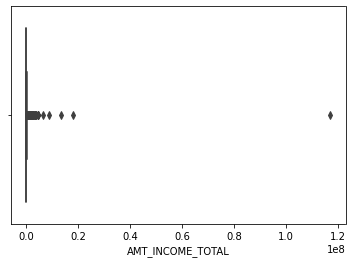

In [12]:
# 1. Titik Pusat Data
sns.boxplot(df['AMT_INCOME_TOTAL'])
plt.show()

C:\Users\ASUS\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


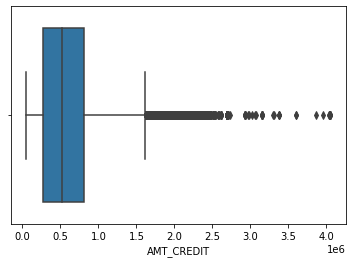

In [13]:
sns.boxplot(df['AMT_CREDIT'])
plt.show()

In [14]:
'''terdapat data outlier pada amount credit dan amount income total, maka untuk mencari titik pusat data akan lebih baik jika menggunakan median'''

'terdapat data outlier pada amount credit dan amount income total, maka untuk mencari titik pusat data akan lebih baik jika menggunakan median'

In [17]:
# titik pusat data Amoun in total income & amount credit

median_landsize = df['AMT_INCOME_TOTAL'].median()
median_price = df['AMT_CREDIT'].median()

print(f'Median dari feature AMT_INCOME_TOTAL adalah {median_landsize}')
print(f'Median dari feature AMT_CREDIT adalah {median_price}')

Median dari feature AMT_INCOME_TOTAL adalah 147150.0
Median dari feature AMT_CREDIT adalah 513531.0


In [18]:
# persebaran data Amoun in total income 
maxtotalincome = np.max(df['AMT_INCOME_TOTAL'])
mintotalincome = np.min(df['AMT_INCOME_TOTAL'])
vartotalincome = np.var(df['AMT_INCOME_TOTAL'])
stdtotalincome = np.std(df['AMT_INCOME_TOTAL'])
print(f'Nilai Maksimal dari feature AMT_INCOME_TOTAL adalah {maxtotalincome}')
print(f'Nilai Minimal dari feature AMT_INCOME_TOTAL adalah {mintotalincome}')
print(f'Nilai variance dari feature AMT_INCOME_TOTAL adalah {vartotalincome}')
print(f'Nilai standar deviasi dari feature AMT_INCOME_TOTAL adalah {stdtotalincome}')

Nilai Maksimal dari feature AMT_INCOME_TOTAL adalah 117000000.0
Nilai Minimal dari feature AMT_INCOME_TOTAL adalah 25650.0
Nilai variance dari feature AMT_INCOME_TOTAL adalah 56227203654.43528
Nilai standar deviasi dari feature AMT_INCOME_TOTAL adalah 237122.7607262434


In [19]:
# persebaran data amount credit
maxtotalcredit = np.max(df['AMT_CREDIT'])
mintotalcredit = np.min(df['AMT_CREDIT'])
vartotalcredit = np.var(df['AMT_CREDIT'])
stdtotalcredit = np.std(df['AMT_CREDIT'])
print(f'Nilai Maksimal dari feature AMT_CREDIT adalah {maxtotalcredit}')
print(f'Nilai Minimal dari feature AMT_CREDIT adalah {mintotalcredit}')
print(f'Nilai variance dari feature AMT_CREDIT adalah {vartotalcredit}')
print(f'Nilai standar deviasi dari feature AMT_CREDIT adalah {stdtotalcredit}')

Nilai Maksimal dari feature AMT_CREDIT adalah 4050000.0
Nilai Minimal dari feature AMT_CREDIT adalah 45000.0
Nilai variance dari feature AMT_CREDIT adalah 161998298760.1231
Nilai standar deviasi dari feature AMT_CREDIT adalah 402490.1225621855


C:\Users\ASUS\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


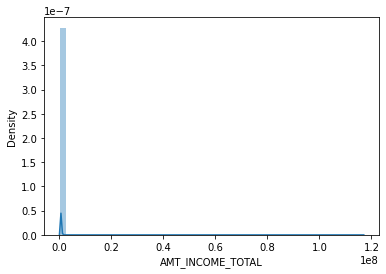

In [23]:
# distribusi data amount in total income
sns.distplot(df['AMT_INCOME_TOTAL'])
plt.show()

C:\Users\ASUS\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


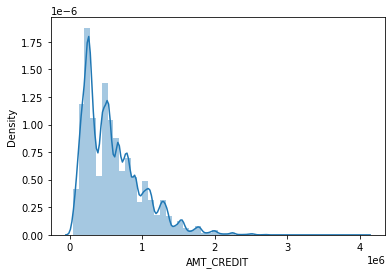

In [24]:
# distribusi data amount credit
sns.distplot(df['AMT_CREDIT'])
plt.show()

In [27]:
add_df = pd.read_csv('HomeCredit_columns_description.csv')
add_df

,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
...,...,...,...,...,...
214,217,installments_payments.csv,NUM_INSTALMENT_NUMBER,On which installment we observe payment,NaN
215,218,installments_payments.csv,DAYS_INSTALMENT,When the installment of previous credit was su...,time only relative to the application
216,219,installments_payments.csv,DAYS_ENTRY_PAYMENT,When was the installments of previous credit p...,time only relative to the application
217,220,installments_payments.csv,AMT_INSTALMENT,What was the prescribed installment amount of ...,NaN


In [37]:
# mencari data outlier days employes
q1_d = df['DAYS_EMPLOYED'].quantile(0.25)
q2_d = df['DAYS_EMPLOYED'].quantile(0.50)
q3_d = df['DAYS_EMPLOYED'].quantile(0.75)
iqr_d = q3_d - q1_d
lower_d = q1_d - 1.5*iqr_d
upper_d = q3_d + 1.5*iqr_d
print(f'Nilai tengah dari feature DAYS_EMPLOYED adalah {q2_d}')
print(f'Nilai bawah dari feature DAYS_EMPLOYED adalah {q1_d}')
print(f'Nilai atas dari feature DAYS_EMPLOYED adalah {q3_d}')
print(f'Dengan nilai lower {lower_d} dan nilai upper {upper_d}')

Nilai tengah dari feature DAYS_EMPLOYED adalah -1213.0
Nilai bawah dari feature DAYS_EMPLOYED adalah -2760.0
Nilai atas dari feature DAYS_EMPLOYED adalah -289.0
Dengan nilai lower -6466.5 dan nilai upper 3417.5


C:\Users\ASUS\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


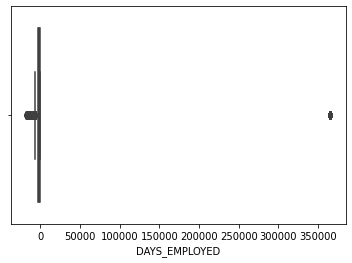

In [38]:
sns.boxplot(df['DAYS_EMPLOYED'])
plt.show()

In [ ]:
'''terdapat outlier pada data days employed yaitu nilai terbawah -6466.5 dan nilai teratas 3417.5'''

C:\Users\ASUS\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


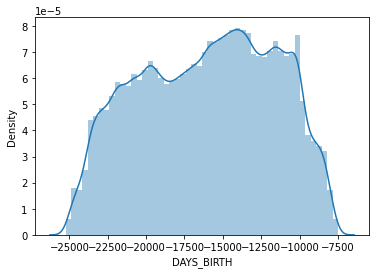

In [39]:
# distribusi days birth
sns.distplot(df['DAYS_BIRTH'])
plt.show()

In [40]:
'''distribusi data days birth menunjukan bentung lonceng yang mana masuk ke dalam distribusi normal'''

'distribusi data days birth menunjukan bentung lonceng yang mana masuk ke dalam distribusi normal'